<H1 style="text-align: center">Tweets Analysis, March 2020 - Europe</H1>
<img src="./images/cover_image.jpg" width=400 height=500 />

#### In this project, we explore a large dataset of tweets collected from the twitter API during the period March 1st to March 31st 2020 These tweets were collected using a geographical filter specifying a rectangular box over Europe. The bounding box used is specified by (longitude,latitude) coordinates. The lower-left corner is at (-24.5, 34.8) and the upper-right is at (69.1, 81.9). No keyword or other thematic filters were applied, so the dataset should contain all tweets that Twitter can identify as originating from the specified region, irrespective of their topic/content.The data is downloaded as a number of compressed files each covering 1 day of data. The whole dataset is large (typically around 450Mb per day when compressed) and contains millions of tweets. It makes up a total of 13.3 GB of compressed data which reaches to 100 GB on being uncompressed. Each file contains a tweet on every line. Tweets are stored as JSON objects, as described in the Twitter developer documentation

In [1]:
import os  # Library for os related operations
import timeit # Library to check execution time
import json # Library to use json file
import gzip # library for unzipping gzip files
import pandas as pd # for data manipulations
import numpy as np # for numerical computation
import matplotlib.pyplot as plt # For visualisation and plots
import folium # For plotting maps
from folium.plugins import MarkerCluster
plt.rcParams['figure.dpi'] = 300 # setting dpi

# 1. Basic Stats and Data Lookup

## 1.1 Data Sampling and Counting the total number of tweets.

*As data has a huge size, samples were collected from each datafile. Data from each day is iterated, capturing every 100th tweet and saving in a new Json file. Number of tweets from each day was counted while iterating each file and count was saved in a dictionary.*

In [ ]:
########### All files, 100th sample from each #############

path3 = "F:\\Twitter Data"
files3 = os.listdir(path3)
files3
print(files3)

start = timeit.default_timer()
sam = []
days = {} # dict to store count of each day tweets

for i in range(len(files3)):
    file_data = []
    count = 0
    with gzip.open(path3+'\\'+files3[i],'rt') as f:
        for line in f:
            file_data.append(line)
            count +=1
            
    days['Day'+str(i+1)] = count  # saving number of tweets from each day
    
    for i in range(len(file_data)):
        if i %100 == 1:
            sam.append(json.loads(file_data[i]))

with open("all_files_sample_100.json", "a+") as outfile:
    json.dump(sam,outfile,indent=2) # Dumping data to a new json file
        
stop = timeit.default_timer()
print('Time: ', stop - start)

In [2]:
%%time
##  loading data from sampled tweets ##
fi = r"all_files_sample_100.json"
with open(fi) as ff:
    data = json.load(ff)
    
print(f"Total records - {len(data)}")

Total records - 239115
CPU times: user 12.6 s, sys: 6.29 s, total: 18.9 s
Wall time: 23.3 s


## 1.2 Dealing with missed data anomalies 

*Data  in  json  file  with  keys  as  'tweets_missed'.  Identified  those  and removed from the json file.*

In [3]:
# Checking missed Tweets
missing_data_idx = []
for i in range(len(data)):
    if 'tweets_missed' in data[i].keys():  # avoiding anomalies of missed tweets
        missing_data_idx.append(i)
print(missing_data_idx)
print(f"Total records with Missing tweets - {len(missing_data_idx)}")

[19304, 64693, 72761, 139017, 139124, 165807, 219835]
Total records with Missing tweets - 7


In [4]:
# lets check how a missing record looks like.
data[64693]

{'timestamp_ms': '1583864087746', 'tweets_missed': 5}

In [5]:
# Filtering data by removing missed tweets in json file
filtered = list(filter(lambda x:'tweets_missed' not in x.keys(),data))
print(len(data))
print(len(filtered))

239115
239108


## 1.3 Creating DataFrame

In [233]:
def tweet_df(data):
    df = pd.DataFrame([i['id'] for i in data], columns=['id'])
    df['tweets'] = [i['text'] for i in data]
    df['language'] = [i['lang'] for i in data]
    df['created'] = pd.to_datetime([i['created_at'] for i in data])
    return df

tw = tweet_df(data=filtered)
dates = tw['created']
tw['day'] = dates.dt.day_name()
tw['weekend'] = tw['day'].isin(["Saturday", "Sunday"])
tw

,id,tweets,language,created,day,weekend
0,1233904784840765441,Yes as far as I have observed no offence your ...,en,2020-03-01 00:00:00+00:00,Sunday,True
1,1233904831229825025,Was doch für Energie in Phantomdiskussionen au...,de,2020-03-01 00:00:11+00:00,Sunday,True
2,1233904874691137537,@GoblinimRegen @javicntvqrer De grillao máximo...,es,2020-03-01 00:00:21+00:00,Sunday,True
3,1233904929342984192,Bin im Bett... https://t.co/oC1fCovNiw,de,2020-03-01 00:00:34+00:00,Sunday,True
4,1233904998465048582,@yazi_yorum__ Amin amin..,en,2020-03-01 00:00:51+00:00,Sunday,True
...,...,...,...,...,...,...
239103,1245123471975354369,@Joanbondia1 https://t.co/qKYXjb6Ov0,und,2020-03-31 22:59:03+00:00,Tuesday,False
239104,1245123523464572929,"""'Quién me ha robado (también) el mes de abril...",es,2020-03-31 22:59:15+00:00,Tuesday,False
239105,1245123572575715330,@TTa13_ 😖😫😷😷😷😷,und,2020-03-31 22:59:27+00:00,Tuesday,False
239106,1245123621804216322,"It was a great day, doing a good cause, God bl...",en,2020-03-31 22:59:39+00:00,Tuesday,False


## 1.4 Dealing with  duplicates

*Duplicate tweets in dataset were recognized using the ‘ID’ parameters of tweets. Tweets with same id were removed  and only single occurrence  was retained.*

In [234]:
# keep = False shows all duplicate record, like which is duplicate of which
# if we don't pass anything, it displays the record whose duplicates are present.
# We check using the ids. Records with same ids are considered as duplicates
tw[tw['id'].duplicated(keep=False) == True]

,id,tweets,language,created,day,weekend
67363,1237544173491736577,trop trop fort,fr,2020-03-11 01:01:38+00:00,Wednesday,False
67371,1237544173491736577,trop trop fort,fr,2020-03-11 01:01:38+00:00,Wednesday,False


In [235]:
# Lets check records with the id we got from above output
# Yeah, there are 2 records with sam id
tw[tw['id'] ==  1237544173491736577]

,id,tweets,language,created,day,weekend
67363,1237544173491736577,trop trop fort,fr,2020-03-11 01:01:38+00:00,Wednesday,False
67371,1237544173491736577,trop trop fort,fr,2020-03-11 01:01:38+00:00,Wednesday,False


In [236]:
# Drop tweets with duplicate ids
tw = tw.drop_duplicates(subset=['id'])

In [237]:
# Lets check now, the records with this id.
# There is only one record now, so duplicate is deleted.
tw[tw['id'] ==  1237544173491736577]

,id,tweets,language,created,day,weekend
67363,1237544173491736577,trop trop fort,fr,2020-03-11 01:01:38+00:00,Wednesday,False


## 1.5 Number of Tweets by Day

*The figure depicts a behavior where there are peaks and dips in total number of tweets during first 10 days of the march. The peaks are usuallyon weekends. But, after 9thMarch, there is a continuous growth in the number of tweets indicating some sort of event causing these many tweets. The maximum number of tweets are observed during 20-22 March. This rise could be a result of Lockdown due to Corona pandemic and increasing number of cases, as the way of life changed for many people and everyone wanted to express their experiences through tweets.*

Text(0.5, 1.0, 'Number of tweets on each day of March')

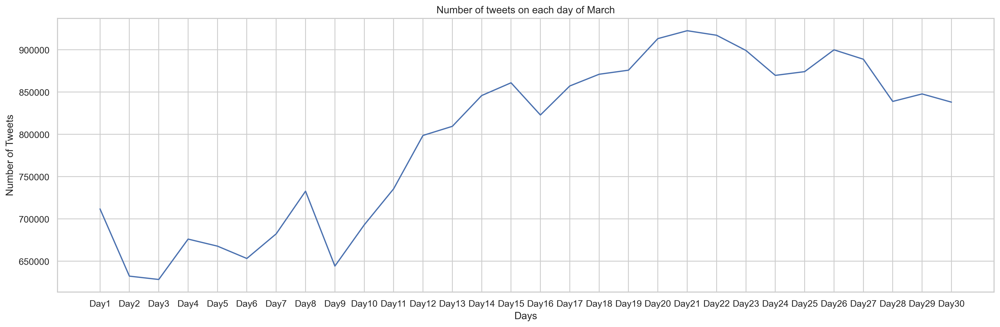

In [298]:
plt.figure(figsize=(20,6))
plt.grid(True)
plt.plot(list(days.keys()),list(days.values()))
plt.xlabel('Days')
plt.ylabel('Number of Tweets')
plt.title("Number of tweets on each day of March")

## 1.6 Breakdown of the number of tweets by language.

*Figure shows the number of tweets originated by different languages in the month of March. Being a global  language  and  most  spoken,  English  is  the most  used  language  for  tweets,  comprising around  30%  of  the  tweets.  Followed  by  Turkish  and  Spanish  forming  14.98%  and  11.43% tweets, respectively. There are around 57 languages being used across European continent for tweets.    Interestingly,  we  can  see  a  good  number  of  tweets  in  undefined  language  around 11.3%. It means that tweets without the language and do not contain sentences or even words. They are just a set of emoticons, symbols, hashtags, user mentions and URLs and do not have any  semantic  value.  But  shows  that  many  people  expressing  their  feeling  over  tweets  using symbols or mentioning their friends in a post or using hashtags.*

*Below is the language statistics observed for tweets in European continent:*

 *	English – 30%*<br></br>
 *	Turkish-14.98%*<br></br>
 *	Spanish - 11.43%*<br></br>
 *	Undefined - 11.3%*<br></br>
 *	French - 7.44%*<br></br>
 *	Others - 24.85%*<br></br>


Text(0.5, 0, 'Language (ISO Codes)')

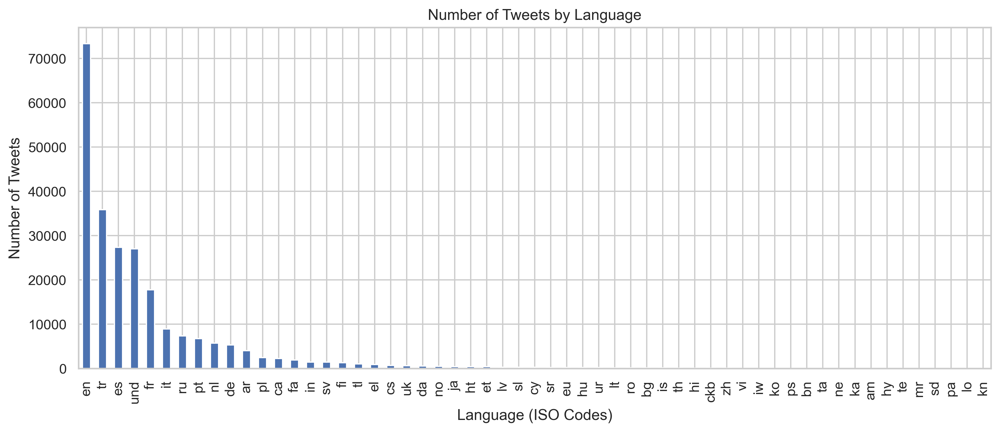

In [299]:
#print(tw['language'].unique())
bylang = tw.groupby('language').count()['tweets'].sort_values(ascending=False)
#print(bylang)
ax = bylang.plot(kind='bar',figsize = (13,5), title = 'Number of Tweets by Language',grid=True)
ax.set_ylabel("Number of Tweets")
ax.set_xlabel("Language (ISO Codes)")

## 1.7 Using a box and whisker diagram (https://en.wikipedia.org/wiki/Box_plot) to compare the number of tweets on a weekday (Monday-Friday) to weekend days (Saturday-Sunday).

In [244]:
tw.groupby('day').count()

,id,tweets,language,created,weekend
day,,,,,
Friday,32761,32761,32761,32761,32761
Monday,38467,38467,38467,38467,38467
Saturday,33399,33399,33399,33399,33399
Sunday,40882,40882,40882,40882,40882
Thursday,23424,23424,23424,23424,23424
Tuesday,38605,38605,38605,38605,38605
Wednesday,31569,31569,31569,31569,31569


In [245]:
days_list = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday', 'Sunday']
tw_day_count = tw.groupby('day').count().reindex(days_list)['tweets'].reset_index()
tw_day_count['weekend'] = tw_day_count['day'].isin(["Saturday", "Sunday"])
tw_day_count

,day,tweets,weekend
0,Monday,38467,False
1,Tuesday,38605,False
2,Wednesday,31569,False
3,Thursday,23424,False
4,Friday,32761,False
5,Saturday,33399,True
6,Sunday,40882,True


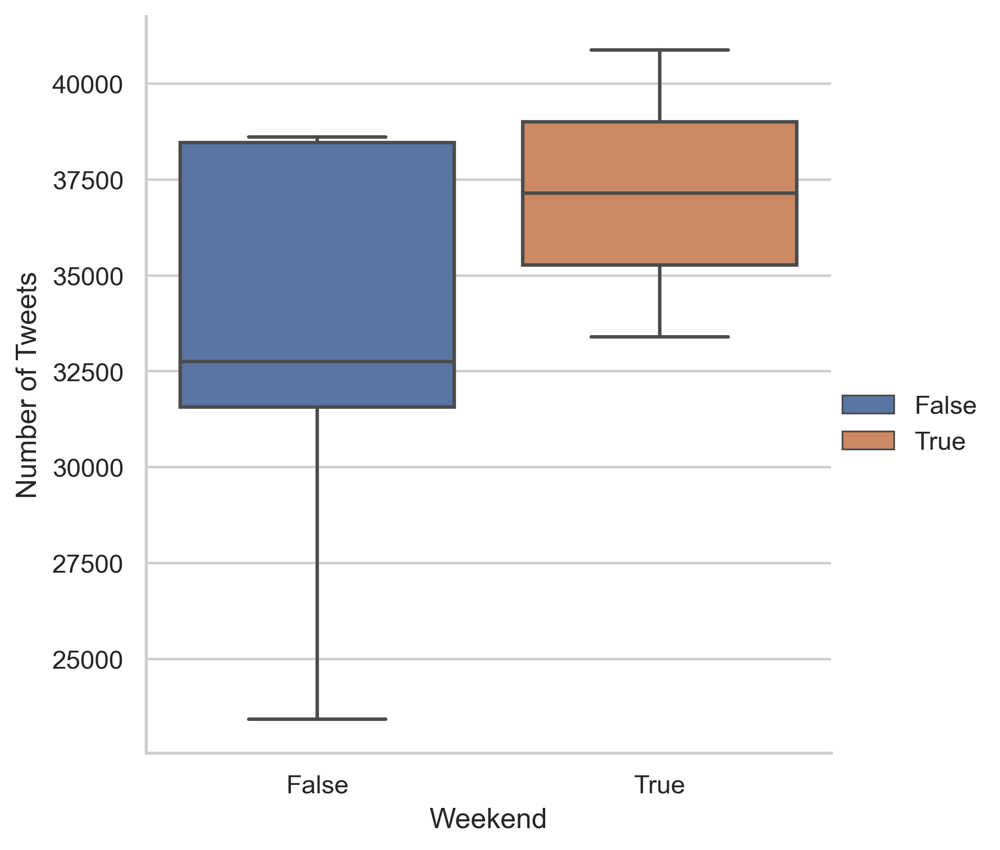

In [305]:
import seaborn as sns

sns.set_style("whitegrid")
ax = sns.catplot(x="weekend", y="tweets", hue="weekend",
           kind="box",dodge=False, data=tw_day_count)
ax.set_ylabels("Number of Tweets")
ax.set_xlabels("Weekend")
ax.add_legend()
ax.savefig("boxplot_weekdays_ends_100samples.png")

#### Let us tabulate the approx. feature values from the diagram for both cases.
| Features| Weekday | Weekend |
| --- | --- | --- |
| Lowest value  | ~11000 | ~32800|
| Highest value | ~ 38625|~42200 |
| Median        |~ 32600 | ~37400|
| Lower Quartile| ~ 31500|~35100 |
|Higher Quartile|~ 38000 |~38700 |

*Total number of tweets are in range of 42500 and in case of weekend tweets across the month- the highest, lowest, median and quartile values are greater than that of weekday tweets; means users tweet at a greater rate on weekends than weekdays. 
Talking about the Interquartile range or the spread of data. Tweets made on weekdays are less consistent than tweets made on weekends. This shows users are tweeting inconsistently over weekdays based on their work and how busy they are, whereas on weekends the tweets are consistent, showing people are tweeting approximately with same trend over weekends.*
	 
	        	 
		 
		 


## 1.8 There are multiple different time zones across Europe. Accounting for this, plotting the average number of tweets at each hour of the day across the time period.

In [249]:
tw['time'] = tw['created'].dt.tz_convert("CET") # convert all time records to CET time zone
tw['time'] = tw['created'].dt.strftime('%H') # Formatting to hour
tweets_by_hour = tw.groupby('time').count()[['id']] # [['id']] , double brackets creates a DF, ['id'] would have created a series
tweets_by_hour.rename(columns = {'id':'num_tweets'}, inplace = True)
tweets_by_hour['num_tweets'] = tweets_by_hour['num_tweets']/31
tweets_by_hour['num_tweets'] = tweets_by_hour['num_tweets'].astype(int)

<ipython-input-249-703081ada464>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tw['time'] = tw['created'].dt.tz_convert("CET") # convert all time records to CET time zone
<ipython-input-249-703081ada464>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tw['time'] = tw['created'].dt.strftime('%H') # Formatting to hour


Text(0.5, 0, '24 hours of day')

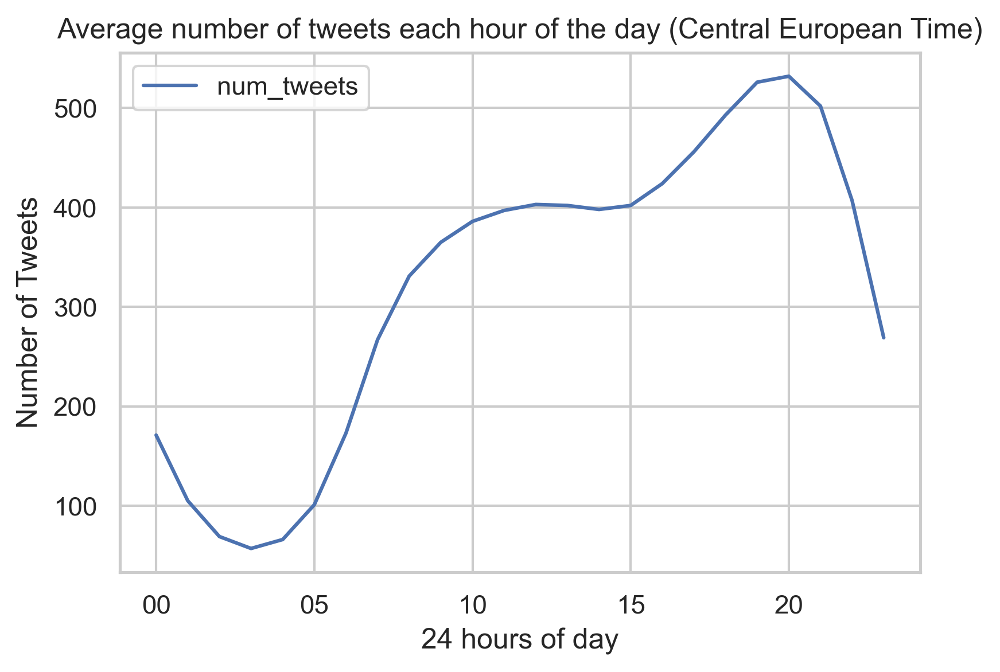

In [306]:
ax = tweets_by_hour.plot(title="Average number of tweets each hour of the day (Central European Time)",grid=True)
ax.set_ylabel("Number of Tweets")
ax.set_xlabel("24 hours of day")

*Above Figure depicts the average number of tweets at each hour of the day across the March month. Central European time (CET) is mostly used time zone across Europe, so tweet timings were converted to CET before plotting the curve.
We can see that the curve starts falling from midnight (users sleeping) and starts rising faster after 5AM as users starts waking up after sleep and get active on twitter. The number of average hourly tweets reaches around 400 from 100. The curve gets stagnant between 10 AM to 3PM as people are at work, making it around 400 average tweets during the time-period. Tweet activities starts increasing after this time in evening and peaks to 550 average tweets and falls again at dinner time and sleeping hours of users.
This graph clearly shows that how social media usage hours are associated with other daily activities and schedule of users.*

# 2. Mapping

## 2.1 Drawing a map of Europe showing the location of the GPS-tagged tweets - these are tweets which have a “coordinates” field in the metadata.

In [15]:
correspo_tweet = []
lat = []
lon = []
user = []
time = []
for i in range(len(filtered)):
    if filtered[i]['coordinates'] != None: # Some tweets don't have coordinates (not geotagged), so skipping them
        lat.append(filtered[i]['coordinates']['coordinates'][1])
        lon.append(filtered[i]['coordinates']['coordinates'][0])
        user.append(filtered[i]['user']['screen_name'])
        time.append(filtered[i]['created_at'])
        correspo_tweet.append(filtered[i]['text'])
        
# Lets save this data in a new dataframe to use for map plotting
new_df = pd.DataFrame({'tweet':correspo_tweet,'latitude':lat, 'longitude':lon, 'user':user, 'time':time})
new_df

,tweet,latitude,longitude,user,time
0,"Steppa now out 🔥🔥🔥🔥🔥🔥 @ London, United Kingdom...",51.507115,-0.127318,BrainTear_Music,Sun Mar 01 00:03:48 +0000 2020
1,"I'm at Regnum Astrum Towers in Esenyurt, Istan...",41.014653,28.676402,yardimcinidayi5,Sun Mar 01 00:17:25 +0000 2020
2,Hedvika #sexyreading #onthetable #nude #pleasu...,45.464300,9.189700,PedroSaudek,Sun Mar 01 00:35:47 +0000 2020
3,"Foto appena pubblicata @ Perugia, Italy https:...",43.112200,12.388900,ciaorinoclub,Sun Mar 01 00:42:34 +0000 2020
4,01b9695b00pD39D7,47.407300,8.825500,object82,Sun Mar 01 00:50:02 +0000 2020
...,...,...,...,...,...
13788,Wakker blijven......\n🧐🧐🧐 @ Capitale des Pays-...,52.309314,4.761543,vagtmael,Tue Mar 31 22:35:01 +0000 2020
13789,"""Broccoli "" in #Durham #UnitedKingdom https://...",54.794100,-1.589080,WhatsOnOLIO,Tue Mar 31 22:42:02 +0000 2020
13790,Són tres quarts i mig d'una de la nit,41.545639,1.893817,HoraCatalana,Tue Mar 31 22:52:02 +0000 2020
13791,Beni gizlice takip edenler\nvia https://t.co/0...,41.037432,28.968616,kapalihesap002,Tue Mar 31 22:52:11 +0000 2020


In [17]:
# Give info about folium javascript callbacks
callback2 = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"}).bindTooltip("Click to read Tweet").openTooltip();'
                'var icon = L.icon({'
                "iconUrl: './images/tw_icon3_edited_42x42.png',"
                "iconSize: '[42, 42]'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '300'});"
                "const display_text = {text: row[2]};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')

pop = ["{}<br> </br> <b>From:</b> <font size='2' color='blue'>@{}</font> <b>at</b> <i>{}</i>".format(t,u,ti) for t,u,ti in zip(correspo_tweet,user,time)]
points = [list(i) for i in zip(lat,lon,pop)]
len(points)

from folium.plugins import FastMarkerCluster
map_fmc = folium.Map(zoom_start=15)
FastMarkerCluster(data = points, callback=callback2).add_to(map_fmc)
map_fmc.save("mymap.html")
map_fmc

*Though the data claims to be from European continent, few geotagged tweets are observed from outside of Europe as well. It includes a good number of tweets from Asia and a few from North America. 
Metropolitan cities like London generates a good number of tweets in UK. On the other hand, countries like Iceland shows very small number of tweets accounting to a low population in the area. The main pattern observed is in the form of active twitter users in more populated areas and influence of social media in these areas.*

# 3. Users

## 3.1 Histogram of tweets per user with number of users on the y-axis and number of tweets they make on the x-axis.

In [252]:
df_users = pd.DataFrame() # Initialise a new dataframe for user details

screen_name = [] 
twt = []
verified = []
time = []
timestamp = []
description = []
friends = []

for i in filtered:
    screen_name.append(i['user']['screen_name'])
    twt.append(i['text'])
    verified.append(i['user']['verified'])
    time.append(i['created_at'])
    timestamp.append(i['timestamp_ms'])
    description.append(i['user']['description'])
    friends.append(i['user']['friends_count'])
    
df_users['user'] = screen_name
df_users['tweet'] = twt
df_users['verified'] = verified
df_users['time'] = pd.to_datetime(time)
df_users['friends'] = friends
df_users['description'] = description

In [101]:
df_users

,user,tweet,verified,time,friends,description
0,robertbeirnes,Yes as far as I have observed no offence your ...,False,2020-03-01 00:00:00+00:00,195,Irish Man Utd fan\nProgressive politics\ncurre...
1,huflaikhan,Was doch für Energie in Phantomdiskussionen au...,False,2020-03-01 00:00:11+00:00,472,"Komponist, Fotograf, Journalist, Musikwissensc..."
2,korleoneeee,@GoblinimRegen @javicntvqrer De grillao máximo...,False,2020-03-01 00:00:21+00:00,1599,#hijosdekorleone 😎 #rcde💙 del #sscnapoli💙 y de...
3,gerkeno,Bin im Bett... https://t.co/oC1fCovNiw,False,2020-03-01 00:00:34+00:00,1072,Mediengestalter und Webdesigner in Ostfrieslan...
4,HKaraaslanoglu,@yazi_yorum__ Amin amin..,False,2020-03-01 00:00:51+00:00,163,Surtaş Granit A.Ş
...,...,...,...,...,...,...
239103,somajopa,@Joanbondia1 https://t.co/qKYXjb6Ov0,False,2020-03-31 22:59:03+00:00,121,"Sabes que no hay vuelta atrás, cuando sonríes ..."
239104,Marina__o_O,"""'Quién me ha robado (también) el mes de abril...",False,2020-03-31 22:59:15+00:00,554,What doesn´t kill U makes U stronger//Refraner...
239105,HalaAlkabalan,@TTa13_ 😖😫😷😷😷😷,False,2020-03-31 22:59:27+00:00,120,Du❤️Keiner denkt wie du . Keiner fühlt wie du....
239106,CamilleMorri30,"It was a great day, doing a good cause, God bl...",False,2020-03-31 22:59:39+00:00,288,Do the best I can and to be myself.


In [253]:
num = df_users.groupby('user').count().sort_values(by='tweet',ascending=False)[['tweet']].rename(columns={'tweet':'num_tweet'})
num

,num_tweet
user,
WhatsOnOLIO,365
infosrv,223
KorayDavulcu2,132
AnimalsHolbox,128
HoraCatalana,117
...,...
SargeInTucson,1
SargantanaAsSol,1
Sardorjanim,1


In [308]:
from collections import Counter
count = Counter(num['num_tweet'])
users = list(count.values())
users_tweets = list(count.keys())
print(count)

Counter({1: 92498, 2: 21311, 3: 8189, 4: 3990, 5: 2195, 6: 1434, 7: 955, 8: 663, 9: 483, 10: 328, 11: 265, 12: 212, 13: 155, 14: 146, 15: 105, 16: 75, 17: 74, 18: 62, 19: 49, 20: 41, 21: 28, 22: 22, 23: 20, 25: 19, 24: 17, 29: 12, 31: 11, 26: 11, 27: 8, 28: 7, 44: 6, 39: 5, 33: 5, 30: 5, 38: 4, 37: 4, 32: 4, 34: 3, 76: 2, 67: 2, 56: 2, 55: 2, 50: 2, 49: 2, 48: 2, 46: 2, 45: 2, 43: 2, 42: 2, 36: 2, 35: 2, 365: 1, 223: 1, 132: 1, 128: 1, 117: 1, 90: 1, 73: 1, 69: 1, 60: 1, 57: 1, 51: 1, 41: 1, 40: 1})


Text(0, 0.5, 'Number of Users')

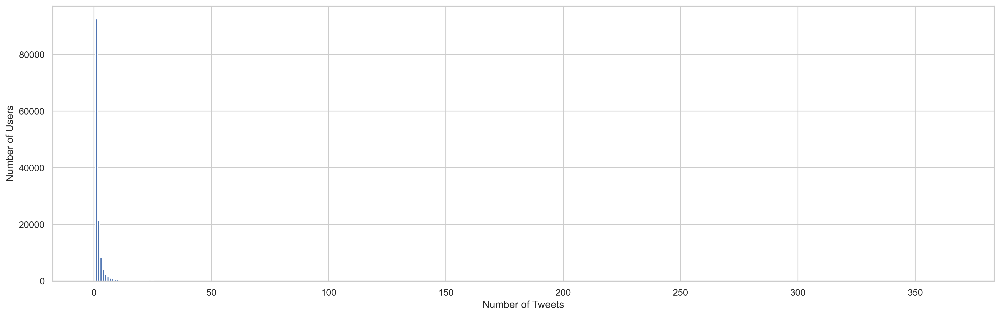

In [307]:
plt.figure(figsize=(20,6))
plt.bar(x = users_tweets, height= users)
plt.xlabel("Number of Tweets")
plt.ylabel("Number of Users")

*Above figure illustrates the number of tweets by number of users. It can be observed that out of 133460 users, around 69.30 % users have posted only 1 tweet in the whole month and 15.9% tweeted twice in one month and around 0.06% users tweeted at least once every day.*

## 3.2 Top-10 users by total number of tweets. Are they automated accounts? 

In [256]:
num.head(10)

,num_tweet
user,
WhatsOnOLIO,365
infosrv,223
KorayDavulcu2,132
AnimalsHolbox,128
HoraCatalana,117
_BB_RADIO_MUSIC,90
haykakan_top,76
RadioTeddyMusic,76
thaiselenags,73


In [257]:
# Top 10 accounts
top10_users = num.head(10).reset_index()['user']
top10_users

0        WhatsOnOLIO
1            infosrv
2      KorayDavulcu2
3      AnimalsHolbox
4       HoraCatalana
5    _BB_RADIO_MUSIC
6       haykakan_top
7    RadioTeddyMusic
8       thaiselenags
9     MathieuRonsard
Name: user, dtype: object

In [258]:
# Checking the status of these top 10 users as verified or not
for i in top10_users:
    print(i, list(df_users[df_users['user'] == i]['verified'])[0])

WhatsOnOLIO False
infosrv False
KorayDavulcu2 False
AnimalsHolbox False
HoraCatalana False
_BB_RADIO_MUSIC False
haykakan_top False
RadioTeddyMusic False
thaiselenags False
MathieuRonsard False


In [262]:
df_users['description'] = [i['user']['description'] for i in filtered]

In [259]:
for i in top10_users:
    print(i +"---"+ str(list(df_users[df_users['user'] == i]['description'])[0]))

WhatsOnOLIO---OLIO's Little Helper here letting you know about all the items being shared on the @OLIO_ex app. 🥕

Download the free app today and start sharing! :)
infosrv---SERVER NOTIFICATIONS
KorayDavulcu2---martı bokuyla deniz kirlenmez
AnimalsHolbox---I do not live on Holbox /hɒl'bɒʃ/ Island, but it is an island which used to be marvellous and I should like to go on holiday there if I were in good health.
HoraCatalana---Ara és l'hora, catalans: aprèn a dir l'hora en català des del teu TL! · Sóc el community manager de @TorreRellotge · [des del 27/abr/2013 16:05]
_BB_RADIO_MUSIC---BB RADIO is one of the leading radio stations in Berlin and Brandenburg in Germany.
haykakan_top---None
RadioTeddyMusic---Das Kinderradio für die ganze Familie. Macht Spaß! Macht schlau!
thaiselenags---camarera de pisos
MathieuRonsard---None


In [265]:
df_users[df_users['user'] == 'infosrv'].head(5)

,user,tweet,verified,time,friends,description
311,infosrv,[11:28:26] 185.176.27.14:58161 &gt;&gt; :18493...,False,2020-03-01 02:28:26+00:00,1,SERVER NOTIFICATIONS
443,infosrv,[13:52:06] 95.156.230.66:23 &gt;&gt; :20120 (T...,False,2020-03-01 04:52:06+00:00,1,SERVER NOTIFICATIONS
2761,infosrv,[22:30:32] 185.176.27.90:56610 &gt;&gt; :19210...,False,2020-03-01 13:30:33+00:00,1,SERVER NOTIFICATIONS
2792,infosrv,[22:35:24] 185.176.27.178:48879 &gt;&gt; :4345...,False,2020-03-01 13:35:24+00:00,1,SERVER NOTIFICATIONS
5278,infosrv,[04:40:26] 51.15.254.13:54522 &gt;&gt; :33848 ...,False,2020-03-01 19:40:26+00:00,1,SERVER NOTIFICATIONS


In [272]:
df_users[df_users['user'] == 'KorayDavulcu2']

,user,tweet,verified,time,friends,description
7030,KorayDavulcu2,@realmadrid @Benzema @marianodiaz7 hello king ...,False,2020-03-01 23:35:48+00:00,122,martı bokuyla deniz kirlenmez
15137,KorayDavulcu2,@dhainternet 2 aydır demirören holdinge ulaşma...,False,2020-03-03 10:42:53+00:00,174,martı bokuyla deniz kirlenmez
16591,KorayDavulcu2,@meral_aksener Meral anne merhaba . Sizede mi ...,False,2020-03-03 15:25:01+00:00,175,martı bokuyla deniz kirlenmez
18764,KorayDavulcu2,@alibabacan Sayın ali bey sizi dinliyorum başl...,False,2020-03-03 20:41:13+00:00,180,martı bokuyla deniz kirlenmez
19828,KorayDavulcu2,@SharecareInc @DrOz @LN_Institute Kıymetli meh...,False,2020-03-04 00:45:29+00:00,189,martı bokuyla deniz kirlenmez
...,...,...,...,...,...,...
232040,KorayDavulcu2,@kayhaninan @MustafaArst @cengizaksan @resatuz...,False,2020-03-31 07:24:24+00:00,201,YA SABIR...
237472,KorayDavulcu2,@sarpyokus @mahirunal https://t.co/AFN3vaTDV0,False,2020-03-31 19:38:53+00:00,201,YA SABIR...
237848,KorayDavulcu2,@BeratAlbayrak Kıymetli AKPARTİ AİLESİ ben 2 ...,False,2020-03-31 20:19:02+00:00,201,YA SABIR...
238740,KorayDavulcu2,@ardilizol0 Merhaba değerli büyük İZOL ailesi ...,False,2020-03-31 22:01:47+00:00,201,YA SABIR...


In [271]:
df_users[df_users['user'] == 'HoraCatalana']

,user,tweet,verified,time,friends,description
462,HoraCatalana,És mig quart de set del matí,False,2020-03-01 05:07:01+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
731,HoraCatalana,Passen cinc minuts de dos quarts de nou del matí,False,2020-03-01 07:35:01+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
1499,HoraCatalana,És mig quart de dotze del migdia,False,2020-03-01 10:07:01+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
2047,HoraCatalana,Són dos quarts i mig d'una del migdia,False,2020-03-01 11:37:02+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
7027,HoraCatalana,Passen cinc minuts de dos quarts d'una de la nit,False,2020-03-01 23:35:02+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
...,...,...,...,...,...,...
230579,HoraCatalana,Passen cinc minuts de dos quarts d'una de la nit,False,2020-03-30 22:35:01+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
232505,HoraCatalana,Són tres quarts d'onze del matí,False,2020-03-31 08:45:01+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
237060,HoraCatalana,Falten cinc minuts per a les nou del vespre,False,2020-03-31 18:55:01+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."
237158,HoraCatalana,Passen cinc minuts de les nou de la nit,False,2020-03-31 19:05:02+00:00,34,"Ara és l'hora, catalans: aprèn a dir l'hora en..."


*Though, there are many parameters and features an automated account can exhibit, a few common behaviours can be used to track down an automated account.*

*•	Verified User – The tweet metadata contains information if a user is verified or not. Verified users on twitter are humans. The result if False for all of them so none of them are verified.
Though, there are many parameters and features an automated account can exhibit, a few common behaviours can be used to track down an automated account.*

*•	User Description – Checking description of user can give glimpse of user type. We can see description for top 10 users in above cells. Out of which it can be clearly understood that “WhatsOnOLIO” is an automated helper account which updates the items post being shared on a food sharing website named “OLIO”.
Other than this, “infosrv” is also an automated account sending SERVER NOTIFICATIONS via tweet as per description. Also, the tweets from infosrv account contains timestamps and Ips generating from a server, clearly indicates it is automated.*

*•	Spam Behaviour: It can include mentioning multiple people or celebrities, with same kind of tweets. User “KorayDavulcu2” can be observed doing the same. In every tweet, the user has mentioned celebrities and football clubs asking for help and may be money. It exhibits a spam behaviour automated using some scripts.*

*•	Repeated, Same kind of tweets User account “HoraCatalana” updates same kind of tweets consist of current Time in “Catalan” language. This clearly seems to be running through a script checking time and posting it in Catlan language.
Tweets from user “_BB_RADIO_MUSIC” are also of same kind, updating the music being played on the Radio station. But, in this case this might be possible that it is being updated by an employee at BB_Radio_Music and could be automated as well. An automated account is fine until not spamming people or causing any harm.*

*•	Number of tweets in a day is also an important factor distinguishing a real person from a bot or automated account. For example,” WhatsOnOLIO” and “infosrv” accounts has approx. 36500 and 22300 tweets in March month converging to 50 and 30 tweets in an hour, respectively. This high frequency of tweets increases their probability of being an automated account.
The remaining accounts like haykakan_top, RadioTeddyMusic, thaislenags, MathieuRonsard has average tweet rate of 9-10 tweets per hour which reduces their probability of being an automated account.*


## 3.3 The number of mentions per user.

In [273]:
# Lets check for a random record, how the user mention section looks like
filtered[7]['entities']['user_mentions']

[{'screen_name': 'ConorRUFC',
  'id_str': '1209436907639377920',
  'id': 1209436907639377920,
  'indices': [0, 10],
  'name': 'Conor'},
 {'screen_name': 'Finlay_Rufc5',
  'id_str': '1219391452972769280',
  'id': 1219391452972769280,
  'indices': [11, 24],
  'name': 'Finlay'},
 {'screen_name': 'OlosundeTheGoat',
  'id_str': '1189623721969029120',
  'id': 1189623721969029120,
  'indices': [25, 41],
  'name': 'Ethan🔴⚪️'}]

In [7]:
mentions = []
for i in filtered:
    if len(i['entities']['user_mentions']) != 0: # record should have mentioned users
        for j in i['entities']['user_mentions']:
            mentions.append(j['screen_name']) # Capture the name of user mentioned

In [9]:
# Counting, how many times a user was mentioned
mention_count = Counter(mentions)

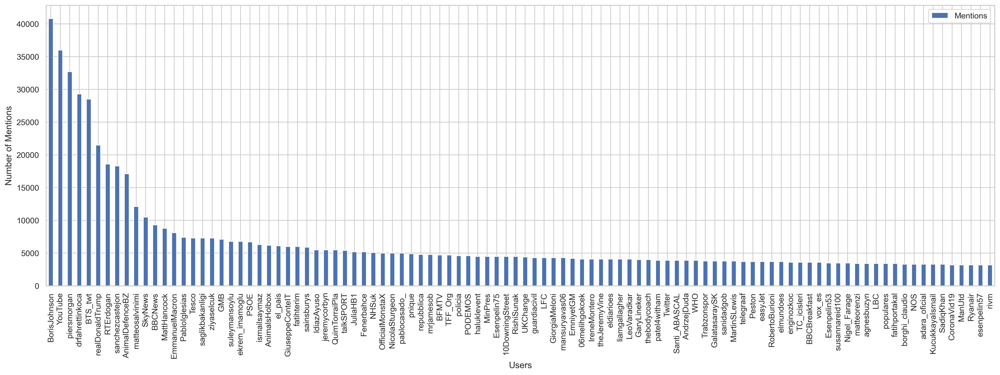

In [309]:
# Lets plot the number of times top100 mentioned users were mentioned
plot_top100 = sorted(mention_count,key=mention_count.get, reverse=True)[0:100]
mentioned_user = []
mentioned = []
for i in plot_top100:
    mentioned_user.append(i)
    mentioned.append(mention_count[i]*100)  # as we sampled every 100th record from main data, so approximating 
                                            # by multiplying with 100
    
mention_df = pd.DataFrame({'Users':mentioned_user,'Mentions':mentioned})
mention_df
ax = mention_df.plot(kind='bar',x='Users',y='Mentions',figsize=(23,7),grid=True)
ax.set_ylabel("Number of Mentions")
plt.savefig("Mentioned users.png")

*Above figure depicts the number of mentions per user for top 100 mentioned users. UK prime minister Boris Johnson is mentioned the most followed by Youtube and Piers Morgan. The number of mentions per user keeps declining and gets quite close after a certain point. The more famous accounts or personalities are mentioned the most as per events and social situation.*

## 3.4 Users who are mentioned the most.


In [10]:
top5_mentions = sorted(mention_count,key=mention_count.get, reverse=True)[0:5]
for i in top5_mentions:
    print(i+"----"+str(mention_count[i]*100))

BorisJohnson----40800
YouTube----36000
piersmorgan----32700
drfahrettinkoca----29300
BTS_twt----28500


In [11]:
# Lets create a dataframe of top 5 mentioned users and analyse it.
mention_boris = []
mention_YouTube = []
mention_piersmorgan = []
mention_drfahrettinkoca = []
mention_BTS_twt =[]
mention_user = []
mention_tweets = []

for i in filtered:
    if len(i['entities']['user_mentions']) != 0:
        for j in i['entities']['user_mentions']:
            if j['screen_name'] == "YouTube":
                mention_user.append("youtube")
                mention_tweets.append(i['text'])
                mention_YouTube.append(i['text'])
            if j['screen_name'] == "BorisJohnson":
                mention_user.append("boris")
                mention_tweets.append(i['text'])
                mention_boris.append(i['text'])
            if j['screen_name'] == "piersmorgan":
                mention_user.append("piersmorgan")
                mention_tweets.append(i['text'])
                mention_piersmorgan.append(i['text'])
            if j['screen_name'] == "drfahrettinkoca":
                mention_user.append("drfahrettinkoca")
                mention_tweets.append(i['text'])
                mention_drfahrettinkoca.append(i['text'])
            if j['screen_name'] == "BTS_twt":
                mention_user.append("BTS_twt")
                mention_tweets.append(i['text'])
                mention_BTS_twt.append(i['text'])

mention_df = pd.DataFrame({'Mentioned User':mention_user, "tweet":mention_tweets})
mention_df             

,Mentioned User,tweet
0,BTS_twt,@cooki_darkness @BTS_twt Ты главное проблемы р...
1,boris,@vickylittlewood @Eve82140453 @patel4witham @B...
2,boris,Agree Freedom. Our land Our Seas. Our Laws. Et...
3,BTS_twt,"Ах, Джин эти танцы, голос, подача😍😍😍\n\nЯ так ..."
4,youtube,@ssamia1994 @bananjo1 @YouTube سمسم الحلوه ههه...
...,...,...
1668,youtube,@SFR_SAV pourquoi @NetflixFR @YouTube et @Prim...
1669,youtube,Déjame ser otra cosa que no sea un cuerpo ✨\n\...
1670,boris,Very bad government @BorisJohnson and @Mayorof...
1671,piersmorgan,"@BoyGeorge @piersmorgan Piers, \n\nWe have put..."


In [12]:
mention_df[mention_df['Mentioned User'] == 'boris']

,Mentioned User,tweet
1,boris,@vickylittlewood @Eve82140453 @patel4witham @B...
2,boris,Agree Freedom. Our land Our Seas. Our Laws. Et...
6,boris,@piersmorgan @BorisJohnson Because everyone kn...
10,boris,@piersmorgan @BorisJohnson Quit panicking
15,boris,Here is the modern answer to this virus! @Save...
...,...,...
1639,boris,@AcademyOfRock @alanbullion2 @mistydog @sianda...
1649,boris,@COVID19NHS @StephenNaulls @nhscampaigns @Char...
1650,boris,@PcAndyLong @PCJedRaven Typical #yids as @Bori...
1658,boris,@BorisJohnson why are you still letting people...


In [14]:
mention_BTS_twt[:10]

['@cooki_darkness @BTS_twt Ты главное проблемы решай и не расстраивайся! Всё в записи, все можно посмотреть при удобн… https://t.co/iHVXN1BX9h',
 'Ах, Джин эти танцы, голос, подача😍😍😍\n\nЯ так горжусь тобой💜\n\n@BTS_twt \nhttps://t.co/ctxBUjzKlo',
 '@BTS_twt',
 '@WWENoWayJose @BTS_twt Jk',
 '@BTS_twt We love you hobiii!!😊😄❤️ https://t.co/h3piUIJd5R',
 '@IR_Purple_Ocean @BTS_twt هممم زیادن ولی گلچین میکنم\nInner child\n#iHeartAwards #BestMusicVideo #BoyWithLuv @BTS_twt',
 '@IR_Purple_Ocean @BTS_twt هممم زیادن ولی گلچین میکنم\nInner child\n#iHeartAwards #BestMusicVideo #BoyWithLuv @BTS_twt',
 '@NataliVaskivska @BTS_twt Нарешті в наших трендах щось справді якісне ☺️',
 'Congratulations @BTS_twt\n#7BillboardNo1Album \n#BTS422KDEBUT \n#BTS4thNo1Album',
 'Дааааа!!! @BTS_twt с "Map Of The Soul: 7" взяли 1 место в чарте бб 200, с продажей в 422 тыс!! 😭😭😭💜💜💜💜💜💜💜… https://t.co/2L7DR85U0I']

<br></br>
*•	Boris Johnson is mentioned the most and can be due to the fact he was tested COVID Positive in March and due to the various new measures being introduced by the government to tackle COVID situation. Many people expressed their views on COVID policies and reacted to other government news by mentioning Boris Johnson.*

*•	YouTube was mentioned second most as it is observed, whenever someone shares a YouTube video on twitter it mentions YouTube twitter account as via @YouTube.*

*•	Piers Morgan is a famous Journalist, Broadcaster and TV Personality. It is observed he was mentioned quite frequently with Boris Johnson. Being a TV news presenter, he was mentioned by multiple users on his news statements on COVID and other government related news.*

*•	Drfahrettinkoca or Dr. Fahrettin Koca is Minister of Health of the Republic of Turkey. Being a health minister and being mentioned often in the times of Global Pandemic is justified here.*

*•	BTS_twt is twitter handle of South Korean boy band and famous for Music Albums.   People were voting for the 2020 iHeartRadio Music Awards using #iHeartAwards and mentioning the music band. The mentions for this music band can be justified with this contest and people voting online by mentioning band and using hashtags. Figure 22 shows some sample tweets.*

# 4. Events

## 4.1 Visually identifying a day with unusually high activity in country of our choice (Ireland and UK). Let's analyse this unsual day and try to find events.

In [29]:
def country_df(data):
    '''
    Creates a dataframe with required columns to analyse countrywide tweets
    
    data: json 
    df: pandas dataframe
    '''
    
    country_codes = []
    place_type = []
    hashtag = []
    mentions = []
    lati = []
    long = []
    user = []
    
    df = pd.DataFrame([i['id'] for i in data], columns=['id'])
    df['tweets'] = [i['text'] for i in data]
    df['created'] = pd.to_datetime([i['created_at'] for i in data])
    # Adding more columns as required

    for i in range(len(data)):
        if data[i]['place'] != None:
            country_codes.append(data[i]['place']['country_code'])
            place_type.append(data[i]['place']['place_type'])
            user.append(data[i]['user']['screen_name'])
        else:
            country_codes.append(np.NaN)
            place_type.append(np.NaN)
            user.append(np.NaN)
        if len(data[i]['entities']['hashtags']) > 0:
            hashtag.append([j['text'] for j in data[i]['entities']['hashtags']])
        else:
            hashtag.append("NA")

        if len(data[i]['entities']['user_mentions']) != 0:
            mentions.append([j['screen_name'] for j in data[i]['entities']['user_mentions']])
            
        else:
            mentions.append("NA")
        if data[i]['coordinates'] != None:
            lati.append(data[i]['coordinates']['coordinates'][1])
            long.append(data[i]['coordinates']['coordinates'][0])
        else:
            lati.append("NA")
            long.append("NA")
            
    df['country'] = country_codes
    df['place_type'] = place_type
    df['hashtags'] = hashtag
    df['mentions'] = mentions
    df['latitude'] = lati
    df['longitude'] = long
    df['user'] = user
    
    return df

def hashtags(series_values):
    '''
    Generates a list of hashtags from series of hashtag data of tweets
    series_values: pandas series from dataframe
    hashtags_final: python list of hashtags
    '''
    hashtags = list(series_values)
    hashtags_final = []
    for i in hashtags:
        if type(i) == list:
            hashtags_final.extend(i)
    return hashtags_final

def geotagged_country(df):
    '''
    Creates a dataframe of geotagged tweets from the input dataframe
    '''
    df_geotagged = df
    df_geotagged = df_geotagged.drop(['id','mentions'],axis=1)
    mask3 = df_geotagged['latitude'] != 'NA'
    df_geotagged = df_geotagged[mask3]
    mask4 = df_geotagged['place_type'] == 'city'
    df_geotagged = df_geotagged[mask4]
    return df_geotagged


from folium.plugins import FastMarkerCluster # plugin from Folium maps to plot large number of markers on map
def make_map(df):
    '''
    Generates a cluster map of tweets
    '''
    
    lat = list(df['latitude'].values)
    lon = list(df['longitude'].values)
    corresp_tweet = list(df['tweets'].values)
    user = list(df['user'].values)
    time = list(df['created'].values)
    
    # Javascript call back to enable message hovering over marker, icon for markers and tweet display upon clicking markers.
    callback2 = ('function (row) {' 
    'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"}).bindTooltip("Click to read Tweet").openTooltip();'
    'var icon = L.icon({'
    "iconUrl: './images/tw_icon3_edited_42x42.png',"
    "iconSize: '[42, 42]'"
        '});'
    'marker.setIcon(icon);'
    "var popup = L.popup({maxWidth: '300'});"
    "const display_text = {text: row[2]};"
    "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
    "popup.setContent(mytext);"
    "marker.bindPopup(popup);"
    'return marker};')

    pop = ["{}<br> </br> <b>From:</b> <font size='2' color='blue'>@{}</font> <b>at</b> <i>{}</i>".format(t,u,ti) 
            for t,u,ti in zip(corresp_tweet,user,time)]
    points = [list(i) for i in zip(lat,lon,pop)]
    map = folium.Map(zoom_start=15)
    FastMarkerCluster(data = points, callback=callback2).add_to(map)
    return map

import re
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
from IPython.display import Image as im

def make_wordcloud(data_list,mask_image_path,title,processed,max_words):
    '''
    Function ot create a wordcloud from input data of tweets
    '''
    #Create a string form of our list of text
    if processed is False:  # Check if input data is already not a list of words, that is not processed already.
        raw_string = ''.join(data_list)
        no_links = re.sub(r'http\S+', '', raw_string) # remove http links
        no_unicode = re.sub(r"\\[a-z][a-z]?[0-9]+", '', no_links) # remove unicode characters
        no_special_characters = re.sub('[^A-Za-z ]+', '', no_unicode) # remove secial characters

        #words = no_special_characters.split(" ")
        words = no_special_characters.split(" ")
        words = [w for w in words if len(w) > 2]  # ignore a, an, be, ...
        words = [w.lower() for w in words]
        words = [w for w in words if w not in STOPWORDS]
    else: # if already a list of words, then string processing not needed.
        words = [w for w in data_list if len(w) > 2]  # ignore a, an, be, ...
        words = [w.lower() for w in words]
        words = [w for w in words if w not in STOPWORDS]
        
    mask = np.array(Image.open(mask_image_path))
    wc = WordCloud(background_color="white", max_words=max_words, mask=mask)
    clean_string = ','.join(words)
    wc.generate(clean_string)

    f = plt.figure(figsize=(10,10))
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title)
    plt.axis("off")
    plt.show()
    plt.close()

In [19]:
df_bycountry = country_df(data=filtered)
# Dropping NaN values
df_bycountry = df_bycountry.dropna()
df_bycountry

,id,tweets,created,country,place_type,hashtags,mentions,latitude,longitude,user
0,1233904784840765441,Yes as far as I have observed no offence your ...,2020-03-01 00:00:00+00:00,IE,city,NA,NA,NA,NA,robertbeirnes
1,1233904831229825025,Was doch für Energie in Phantomdiskussionen au...,2020-03-01 00:00:11+00:00,DE,city,NA,NA,NA,NA,huflaikhan
2,1233904874691137537,@GoblinimRegen @javicntvqrer De grillao máximo...,2020-03-01 00:00:21+00:00,ES,city,NA,"[GoblinimRegen, javicntvqrer]",NA,NA,korleoneeee
3,1233904929342984192,Bin im Bett... https://t.co/oC1fCovNiw,2020-03-01 00:00:34+00:00,DE,city,NA,NA,NA,NA,gerkeno
4,1233904998465048582,@yazi_yorum__ Amin amin..,2020-03-01 00:00:51+00:00,TR,city,NA,[yazi_yorum__],NA,NA,HKaraaslanoglu
...,...,...,...,...,...,...,...,...,...,...
239103,1245123471975354369,@Joanbondia1 https://t.co/qKYXjb6Ov0,2020-03-31 22:59:03+00:00,ES,city,NA,[Joanbondia1],NA,NA,somajopa
239104,1245123523464572929,"""'Quién me ha robado (también) el mes de abril...",2020-03-31 22:59:15+00:00,ES,city,NA,NA,NA,NA,Marina__o_O
239105,1245123572575715330,@TTa13_ 😖😫😷😷😷😷,2020-03-31 22:59:27+00:00,SY,country,NA,[TTa13_],NA,NA,HalaAlkabalan
239106,1245123621804216322,"It was a great day, doing a good cause, God bl...",2020-03-31 22:59:39+00:00,GB,city,[HelpNewham],"[activeNewham, aNCommunity1, TeamKineticUK]",NA,NA,CamilleMorri30


In [20]:
tweets_by_country_UK = df_bycountry[df_bycountry['country'] == 'GB']
tweets_by_country_UK = tweets_by_country_UK.groupby([df_bycountry['created'].dt.date]).count()[['id']]
tweets_by_country_UK = tweets_by_country_UK.reset_index()
tweets_by_country_UK.rename(columns = {'id':'num_tweets'}, inplace = True)
tweets_by_country_UK = tweets_by_country_UK.set_index('created')

Text(0, 0.5, 'Number of tweets')

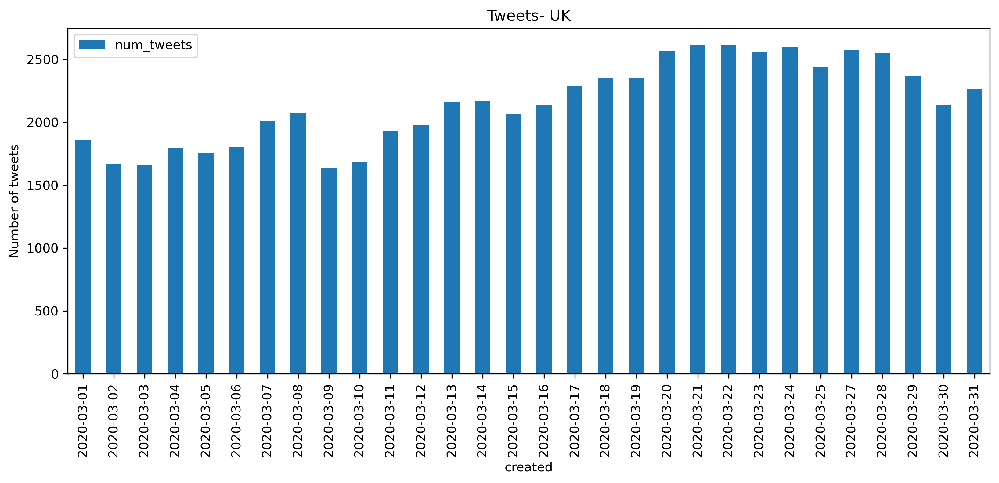

In [21]:
ax = tweets_by_country_UK.plot(kind='bar',figsize = (13,5))
ax.set_title("Tweets- UK")
ax.set_ylabel("Number of tweets")

Text(0.5, 1.0, 'Tweets- Ireland')

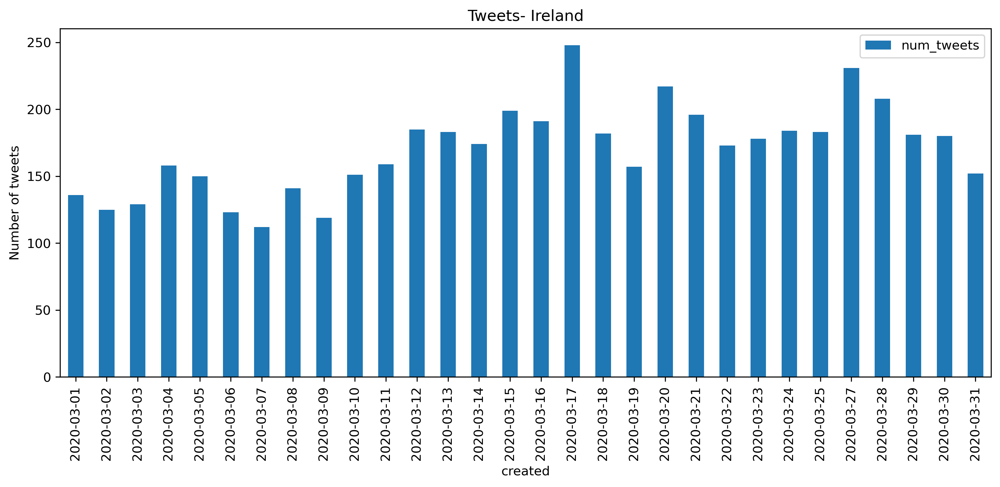

In [22]:
tweets_by_country_IE = df_bycountry[df_bycountry['country'] == 'IE']
tweets_by_country_IE = tweets_by_country_IE.groupby([df_bycountry['created'].dt.date]).count()[['id']]
tweets_by_country_IE = tweets_by_country_IE.reset_index()
tweets_by_country_IE.rename(columns = {'id':'num_tweets'}, inplace = True)
tweets_by_country_IE = tweets_by_country_IE.set_index('created')
ax = tweets_by_country_IE.plot(kind='bar',figsize = (13,5))
ax.set_ylabel("Number of tweets")
ax.set_title("Tweets- Ireland")

*Selecting one country of interest as Ireland. We plot a bar chart of number of tweets on each day of March 2020 in Ireland. The tweet metadata contains place[‘country_code] as a key which can be used to filter the tweets on basis of country. We can filter the country-wise data based on the country codes, for example – ‘IE’ for Ireland and ‘GB’ for United Kingdom. Users are asked to attach a geographic place to tweet before publishing it and even the exact    coordinates to have, so the final tweet can have exact geo coordinates. Place type could be a    city, administrative area or admin, country, or some exact concrete points. We narrow down to place_type as city and geotagged to detect specific events at places and mark them on map, as place type- country or admin are too big.*

*Above figures(generated using the earlier sampled data of every 100th tweet per file) shows the total number of tweets on each day of March 2020 originated from Ireland. The figure clearly depicts a spike on 17th March 2020 (Tuesday), can be identified as an unusual day and investigated for the event took place on this day.*

*Selecting second country as United Kingdom, we can see above (generated using the earlier sampled data of every 100th tweet per file), the number of tweets in March 2020 in UK. A surge can be seen after 19th March and almost continues throughout the end of month. We select 22nd March and 24th March for the analysis, 22nd March visualise as one of the days with highest tweets and falls on weekend. On the other hand, 24th March is a weekday and almost same number of tweets. These two days can be investigated for this huge number of tweets as compared with other days and indicating possibility of some events on these days.*

#### Full  data is read for these specific dates and countries, instead of samples and dumped into a new json file for analysis.

## 4.2 Analysis of 17th March tweets in Ireland.

In [7]:
##### Modelling on 17 March data of Ireland ###

path4 = "F:\\Twitter Data\\ireland_17"
files4 = os.listdir(path4)
files4
print(files4)

start = timeit.default_timer()
sam = []
#days_all = {} # dict to store count of each day tweets

for i in range(len(files4)):
    file_data = []
    #count = 0
    with gzip.open(path4+'\\'+files4[i],'rt') as f:
        for line in f:
            tweet = json.loads(line)
            try:
                if tweet['place'] != None and tweet['place']['country_code'] == "IE":
                    file_data.append(tweet)
            except KeyError as k:
                print(k)
            #count +=1
            
    #days_all['Day'+str(i+1)] = count  # saving number of tweets from each day
    
    #for i in range(len(file_data)):
        #if i %2 == 1:  # every second tweet
        #sam.append(json.loads(file_data[i]))
        #sam.append(json.load(file_data[i]))

with open("ierland_17march.json", "a+") as outfile:
    #json.dump(sam,outfile,indent=2) # Dumping data to a new json file
    json.dump(file_data,outfile,indent=2)
        
stop = timeit.default_timer()
print('Time: ', stop - start)

['geoEurope_20200317.gz']
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
'place'
Time:  110.47166710000056


In [23]:
##  loading data from sample ##
with open("ierland_17march.json") as ff:
    data_17 = json.load(ff)

In [27]:
df_ireland = country_df(data=data_17)
df_ireland.dropna()
df_ireland

,id,tweets,created,country,place_type,hashtags,mentions,latitude,longitude,user
0,1239703003927633920,A male cat was lost on 15/01/2020 in Elmwood A...,2020-03-17 00:00:03+00:00,IE,city,"[Dublin, lpie]",NA,53.324487,-6.255028,lostfoundpets
1,1239703011968069638,@liamgallagher Alright brother - who’s your fa...,2020-03-17 00:00:05+00:00,IE,city,NA,[liamgallagher],NA,NA,GaryTraynor21
2,1239703036454408192,🕛 Doong Doong Doong Doong Doong Doong Doong D...,2020-03-17 00:00:11+00:00,IE,city,NA,NA,NA,NA,DublinClock
3,1239703036643151875,@zecabhs https://t.co/PTlZDW5P9r,2020-03-17 00:00:11+00:00,IE,city,NA,[zecabhs],NA,NA,Rafiinha_Fraga
4,1239703057656668161,"Putz, igualzinho meu amigo do ensino médio fal...",2020-03-17 00:00:16+00:00,IE,city,NA,NA,NA,NA,Leandrowvski
...,...,...,...,...,...,...,...,...,...,...
25886,1240065342422093831,@Michael_O_Regan They may aswel teach the kids...,2020-03-17 23:59:51+00:00,IE,city,NA,[Michael_O_Regan],NA,NA,tin1tin1
25887,1240065345639141380,@DublinAirport Is it true that she has it in f...,2020-03-17 23:59:52+00:00,IE,city,NA,[DublinAirport],NA,NA,n_sweeny
25888,1240065359631302656,@TarynDeVere I’m still voting for yeast when t...,2020-03-17 23:59:55+00:00,IE,city,NA,[TarynDeVere],NA,NA,ManyifnotMost
25889,1240065366518386688,@ghahreeb @SandraJese @misscherobie @adeallmar...,2020-03-17 23:59:57+00:00,IE,city,NA,"[ghahreeb, SandraJese, misscherobie, adeallmar...",NA,NA,Gerard36Delaney


In [223]:
# Creating a list of hashtags for 17th march ireland tweets
hashtags_17 = hashtags(df_ireland['hashtags'].values)

In [28]:
# Taking out only geotagged data
df_geotagged_ireland = geotagged_country(df_ireland)
df_geotagged_ireland

,tweets,created,country,place_type,hashtags,latitude,longitude,user
0,A male cat was lost on 15/01/2020 in Elmwood A...,2020-03-17 00:00:03+00:00,IE,city,"[Dublin, lpie]",53.324487,-6.255028,lostfoundpets
7,"23:44 Temp. 7.1°C, Hum. 91%, Dewp. 5.3°C, Bar....",2020-03-17 00:00:19+00:00,IE,city,NA,53.762838,-8.764596,BallyhaunisWX
22,Special people need Special medicine xxx. We ...,2020-03-17 00:01:31+00:00,IE,city,NA,53.349782,-6.253722,jonocoleman
227,#bedtimeyoga tonight chilled Sherlock right ou...,2020-03-17 00:13:33+00:00,IE,city,"[bedtimeyoga, dogyoga, yogapug, hairybaby, sme...",53.011905,-6.107882,lazmurray
318,Arriving tomorrow! Free to view - a concert pe...,2020-03-17 00:20:21+00:00,IE,city,NA,53.3476,-6.2591,Anuna_Choir
...,...,...,...,...,...,...,...,...
25635,"Ireland, it's the one place on earth\n\nThat h...",2020-03-17 23:46:28+00:00,IE,city,NA,53.3476,-6.2591,blyssfulalchemy
25812,"In honor of St. Paddy’s Day, I give you “View ...",2020-03-17 23:56:16+00:00,IE,city,NA,52.055907,-9.974946,Wildlifeguy00
25834,🇮🇪 ☘️ St. Patrick’s Day: O dia mais esperado e...,2020-03-17 23:57:35+00:00,IE,city,NA,53.3476,-6.2591,emillegomesrosa
25839,https://t.co/70VXJkLk99,2020-03-17 23:57:49+00:00,IE,city,NA,52.407883,-7.487098,january28150119


In [38]:
## Creating map of geotagged tweets to see tweets from a particular place
map_ireland = make_map(df_geotagged_ireland)
map_ireland.save("mymap_ireland.html")
map_ireland

*We analyse the tweet map for ireland on 17th march 2020 to detect events across the country. It indicates that many people has tweeted by geotagging O’Connell Street/Bridge and mentioned St. Patrick Day. 17th March 2020 is celebrated as St. Patrick Day in Ireland and the street hosts big parades and celebrations. The geotagged location- O’Connell Street is hub for the parade. But, due to Covid Lockdown, the parade was cancelled. We click on the cluster from O'Connel Bridge and tweets indicates people feeling sad about cancelling of parade, while some express the festive feel and appeals to stay home.*

<img src="./images/ireland1.png" width=600 height=700 /> <br> </br>
<img src="./images/ireland.png" width=900 height=700 />



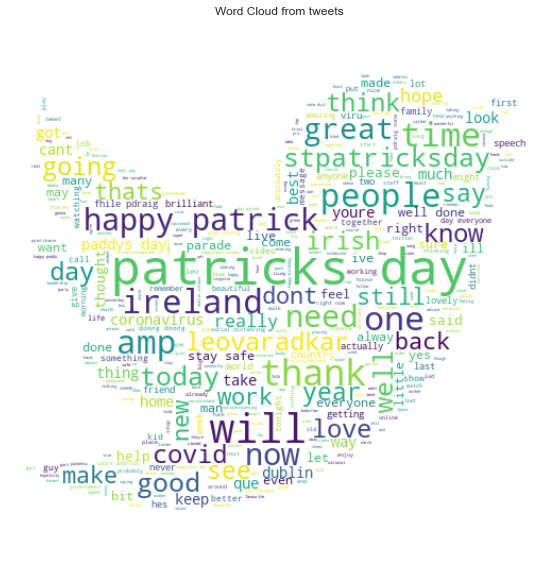

In [218]:
## Creating word cloud of tweets for Ireland ## 
wc_tweets_ireland = list(df_ireland['tweets'].values)
make_wordcloud(data_list=wc_tweets_ireland,mask_image_path = 'wordcloud_background2.png',
               title='Word Cloud from tweets',processed=False,max_words=2000)

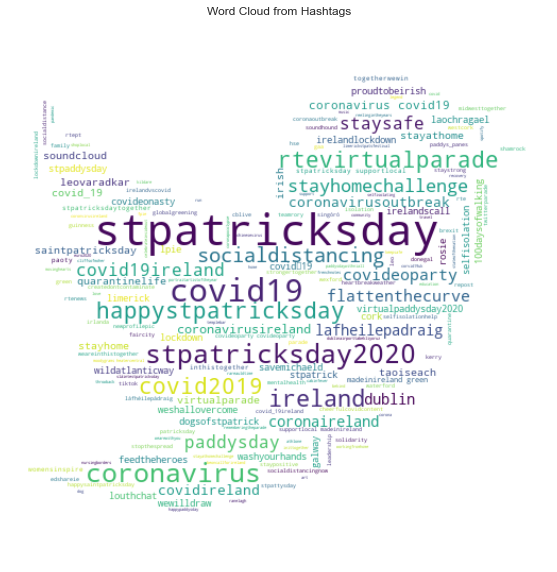

In [220]:
## Word cloud from Hastags in Ireland
make_wordcloud(data_list=hashtags_17_final,mask_image_path = 'wordcloud_background2.png',
               title='Word Cloud from Hashtags',processed=True,max_words=200)

*St. Patrick day, cancellation of famous parade and introduction of a virtual parade due to COVID lockdown causes people to tweet a lot about this event. Above figures shows a word cloud generated from the tweets on the respective day, and most of them are talking about St. Patrick’s Day in Ireland.
People often use Hash Tags to portray a specific topic. We also plot a word cloud form hash tags people used on 17th March 2020. Most of them are talking about St. Patrick’s Day, RTE Virtual Parade, Corona Virus and appealing to stay home and stay safe.
Therefore, 17th March 2020 trended with topic of St. Patrick’s Day, which was not celebrated the usual way due to Coronavirus and hosted a Virtual Parade. Below news articles validate these findings.*

	https://www.bbc.co.uk/news/uk-northern-ireland-51930715

	https://www.irishtimes.com/news/ireland/irish-news/st-patrick-s-day-in-dublin-we-didn-t-think-it-would-be-as-bad-as-this-1.4205112

	https://www.irishtimes.com/news/ireland/irish-news/people-improvise-with-virtual-st-patrick-s-day-parades-1.4205276

## 4.3 Analysis of 24th March tweets in UK.

In [ ]:
### Modelling on UK Data ###
## Generating UK Data ## 
path5 = "F:\\Twitter Data\\uk22_24"
files5 = os.listdir(path5)

for i in range(len(files5)):
    file_data = []
    with gzip.open(path5+'\\'+files5[i],'rt') as f:
        for line in f:
            tweet = json.loads(line)
            try:
                if tweet['place'] != None and tweet['place']['country_code'] == "GB":
                    file_data.append(tweet)
            except KeyError as k:
                print(k)

with open("UK_22_24.json", "a+") as outfile:
    json.dump(file_data,outfile,indent=2)
file_data = []       

In [31]:
with open("UK_22_24.json") as ff:
    data_uk = json.load(ff)

In [32]:
df_uk = country_df(data=data_uk)
df_uk.dropna()
df_uk

,id,tweets,created,country,place_type,hashtags,mentions,latitude,longitude,user
0,1242239705330200577,@TudorsDynasty Natalie and Genevieve,2020-03-24 00:00:00+00:00,GB,city,NA,[TudorsDynasty],NA,NA,Anna_Bolena_
1,1242239706433273856,I will point this out for the hard of hearing-...,2020-03-24 00:00:00+00:00,GB,city,NA,NA,NA,NA,AmigoNews20
2,1242239711269269509,@craicpype @BudgetNostalgia @RetroBoyJon @Retr...,2020-03-24 00:00:01+00:00,GB,city,NA,"[craicpype, BudgetNostalgia, RetroBoyJon, Retr...",NA,NA,itsmecurrie
3,1242239709583204353,Here I explain the best ways to access St Augu...,2020-03-24 00:00:01+00:00,GB,city,NA,NA,NA,NA,FrKane
4,1242239712368168960,@nicktolhurst Ahhhh !\nThe benefits of EU frie...,2020-03-24 00:00:01+00:00,GB,city,NA,[nicktolhurst],NA,NA,gord1brad
...,...,...,...,...,...,...,...,...,...,...
255392,1242602079019053056,Day 2 in quarantine got in a mess,2020-03-24 23:59:56+00:00,GB,city,NA,NA,NA,NA,RTrayner
255393,1242602079090335745,@DisneyPlusUK I keep getting warned my payment...,2020-03-24 23:59:56+00:00,GB,city,NA,[DisneyPlusUK],NA,NA,willwearswhat
255394,1242602085541130241,@andrewmcb You need to sleep!!!! Cuddle up and...,2020-03-24 23:59:58+00:00,GB,city,NA,[andrewmcb],NA,NA,Markloveskylie
255395,1242602089932566528,@PSPeopleProject This little piggy had none?,2020-03-24 23:59:59+00:00,GB,city,NA,[PSPeopleProject],NA,NA,andydmeadows28


In [33]:
# Filtering data for just 24th march 
date2 = (df_uk['created'] >= '2020-03-24')
df_uk_date2 = df_uk.loc[date2]

In [35]:
# Taking out only geotagged data
df_geotagged_uk_date2 = geotagged_country(df_uk_date2)
df_geotagged_uk_date2

,tweets,created,country,place_type,hashtags,latitude,longitude,user
6,"23:48 Temp. 3.9°C, Hum. 78%, Dewp. -0.6°C, Bar...",2020-03-24 00:00:02+00:00,GB,city,NA,50.792653,-3.195868,weather_honiton
19,"23:40 Temp. 6.3°C, Hum. 89%, Dewp. 4.1°C, Bar....",2020-03-24 00:00:06+00:00,GB,city,NA,50.55381,-3.54028,terry_bannon
26,"Yorkshire Racing Club, Pudsey,Leeds @ https://...",2020-03-24 00:00:09+00:00,GB,city,"[tnc, areacode, transport]",53.797022,-1.661158,area_code_check
39,"23:58 Temp. 4.7°C, Hum. 64%, Dewp. -2.7°C, Bar...",2020-03-24 00:00:14+00:00,GB,city,NA,51.44488,-0.469746,BryanGodfree
40,"Wind 4.8 mph SW. Barometer 1026.75 hPa, Rising...",2020-03-24 00:00:15+00:00,GB,city,NA,53.418056,-1.488056,SheffieldWX
...,...,...,...,...,...,...,...,...
255180,I'm at Woodger Family's (Including Pets) Livin...,2020-03-24 23:57:40+00:00,GB,city,NA,51.07525,-1.808392,noodlebarnet88
255216,Baby Adidas #baby #crochet #boy #love @ Aberde...,2020-03-24 23:57:59+00:00,GB,city,"[baby, crochet, boy, love]",57.1526,-2.11,sharon_milne
255332,"I'm at Family Administration Hq in Salisbury, ...",2020-03-24 23:59:12+00:00,GB,city,NA,51.076698,-1.806067,noodlebarnet88
255352,"""Needing supplies as have COVID-19"" in #Feltha...",2020-03-24 23:59:24+00:00,GB,city,"[Feltham, UnitedKingdom, foodwaste, free]",51.4436,-0.42523,WhatsOnOLIO


In [36]:
# Mapping the geotagged data, excluding tweets from WhatsOnOLIO bot
map_uk_date2 = make_map(df_geotagged_uk_date2[df_geotagged_uk_date2['user'] != 'WhatsOnOLIO'])
map_uk_date2.save("mymap_uk_day24.html")
map_uk_date2

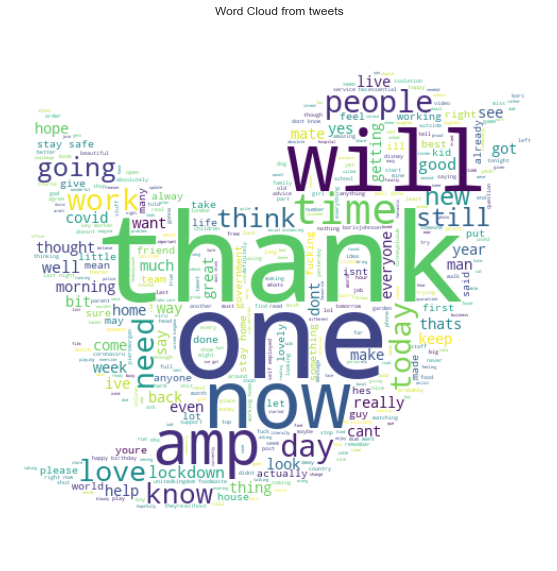

In [295]:
## Creating word cloud of tweets for UK ## 
wc_uk_date2 = list(df_uk_date2['tweets'].values)
make_wordcloud(data_list=wc_uk_date2,mask_image_path = 'wordcloud_background2.png',
               title='Word Cloud from tweets',processed=False,max_words=2000)

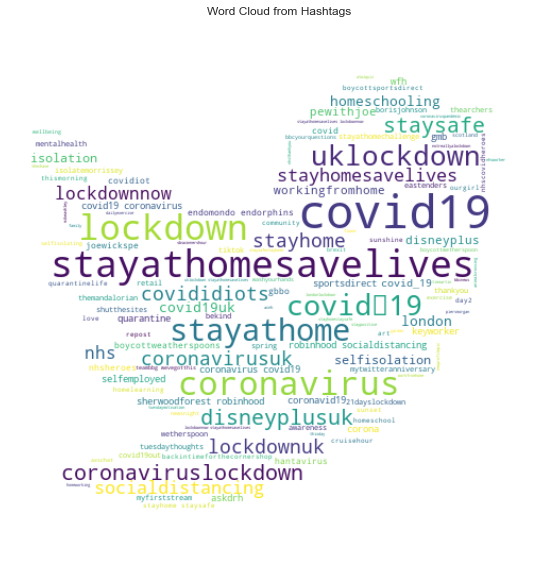

In [296]:
## Word cloud from Hastags in UK
df_uk_date2 = df_uk_date2[df_uk_date2['user'] != 'WhatsOnOLIO']
hashtags_uk_date2 = hashtags(df_uk_date2['hashtags'].values)
make_wordcloud(data_list=hashtags_uk_date2,mask_image_path = 'wordcloud_background2.png',title='Word Cloud from Hashtags',processed=True,max_words=2000)

*There are large number of tweets across UK, but the clustering does not indicate towards any public event or gathering. Instead, most of the tweets mentions about National Lockdown, COVID, staying home and safe, working from home, some jewellers and businesses in London talking about closing their shops after receiving some message from Prime Minister and Government, indicate towards a big announcement that affected everyone. Below map figures displays some indicative tweets for the same.*

<img src="./images/uk_24.png" width=700 height=750 /> <br> </br>

*Drawing a word cloud of Hashtags from tweets on 24th March 2020 portrays words like UK Lockdown, COVID, Staying Home, staying safe, coronavirus lockdown and many more. This clearly depicts the Nationwide Lockdown due to Coronavirus in UK declared by the government. Moreover, DisneyPlus UK is also a buzz keyword on this day, indicating some event related to Disney Plus streaming services.*

*Therefore, we can recognise 2 events on 24th March 2020 people are talking about. First is the National Wide Lockdown declared by the UK government and Prime Minister Boris Johnson and launching of Streaming services by Disney Plus in UK. Below news articles validates the events.*

	https://www.theguardian.com/world/2020/mar/24/a-national-emergency-how-the-uk-papers-covered-the-coronavirus-lockdown

	https://www.theguardian.com/tv-and-radio/2020/jan/21/disney-streaming-service-to-launch-earlier-in-uk-on-24-march


# 5. REFLECTION

*Twitter is one of the social network giants with over 300 million active users [1] and 6000 tweets per second averaging to around 500 million tweets posted in one day [2] as per recent trends.
The Data can be fetched from twitter using its powerful API and can be restricted by setting specific criteria like locations. The tweets originate from almost all locations containing metadata like- demographics, user details etc. and almost acting like Live news feeds as users can tweet instantly, whatever happening around them. In this report we gained insights on trends of tweets by location, language, visualised them on maps, analysed number of tweets from users, got to know about popular users and even tried to identify the events and activities using the tweets. This makes twitter a very strong data source, enabling to draw a picture of worldwide activities. Some case studies even detect natural disasters [3] [4] using twitter data.<br> </br>
But there are downsides too, like there are costs involved with full data APIs and free APIs cap data to 1% of tweets. Additionally, data may contain the missing fields and duplicate records and needs cleansing. Also, spam tweets and automated accounts contributes noise to data. One in every 21 tweets is estimated to be spam [5] and 15% of users can be automated bots [6], hindering meaningful analysis and questioning data credibility. 
Moreover, like every other organic data, the twitter data can be biased as the data is sampled from a small population. [7] mentions the twitter data generated about Hurricane Sandy which was generated from Manhattan based on larger number of twitter users from the city portraying it as hub of disaster. And very few tweets generated from worst affected locations due to drained batteries after power cut. The biased data in this case did not reflected the actual situation due to hurricane.<br> </br>
Twitter data is publicly available by API or data resellers and not everyone is aware that their data is available for analysis and scrutiny. It raises questions with ethical use of data and user’s consent with use of their tweets and geospatial locations. Anonymity of a user needs to be maintained as it might risk the user in case, tweets are offending a particular group or organisation. To address these ethical and legal concerns, Twitter’s Terms of Service and Privacy Policy [8] has governing guidelines for using Twitter platform and by agreeing to service agreement, users consent for their information to be collected and used by third parties. Using the data for research and other activities can be justified by users agreeing to these terms. However, other forms of collecting data like scraping the Services without the prior consent of Twitter is expressly prohibited.<br> </br>
Therefore, twitter data allows study of emerging stories, disasters, political movements etc. as soon as they occur and summarises world’s sentiments. This data if used ethically can produce best results for betterment of humans and regulated practices can help to avoid events like Cambridge Analytica Scandal.<br> </br><br> </br>
**References:** <br> </br><br> </br>
[1] https://www.statista.com/statistics/272014/global-social-networks-ranked-by-number-of-users/<br> </br>
[2] https://www.internetlivestats.com/twitter-statistics/<br> </br>
[3] Sakaki, T., Okazaki, M., Matsuo, Y.: Earthquake shakes twitter users: Real-time event detection by social sensors. In: Proceedings of the 19th International Conference on World Wide Web. pp. 851–860. WWW ’10, ACM, New York, NY, USA (2010), http://doi.acm.org/10.1145/1772690.1772777<br> </br>
[4] De Longueville, B., Smith, R.S., Luraschi, G.: Omg, from here, i can see the flames!”: A use case of mining location based social networks to acquire spatiotemporal data on forest fires. In: Proceedings of the 2009 International Workshop on Location Based Social Networks. pp. 73–80. LBSN ’09, ACM, New York, NY, USA (2009), http://doi.acm.org/10.1145/1629890.1629907<br> </br>
[5] Isa Inuwa-Dutse, Mark Liptrott, Ioannis Korkontzelos, Detection of spam-posting accounts on Twitter, Neurocomputing, Volume 315, 2018, Pages 496-511, ISSN 0925-2312, https://doi.org/10.1016/j.neucom.2018.07.044.
[6] O. Varol, E. Ferrara, C.A. Davis, F. Menczer, A. FlamminiOnline human–bot interactions: detection, estimation, and characterization Proceedings of the International AAAI Conference on Web and Social Media, AAAI Press (2017), pp. 280-289<br> </br>
[7] https://hbr.org/2013/04/the-hidden-biases-in-big-data<br> </br>
[8] https://twitter.com/en/tos<br> </br>*
